# Imports

In [20]:
import requests
import pprint
import json
import os
import numpy as np
import matplotlib.pyplot as plt
from captioning.captioning_config import Config
pp = pprint.PrettyPrinter(indent=4, depth=6)
config = Config()
verbose = True
val_data_dir = config.val_root_dir_coco

# Formulate Query

In [22]:
queries = ["A bird is sitting on the top of a tree branch .",
          "A plate of food and a drink on a table .",
          "A person with a ski board on a snow slope .",
          "A person sitting on a chair in front of a laptop ."]


In [14]:
image_paths = ["surfing.jpg",
               "football.webp"
              ]

# Helper Functions:

In [15]:
def show_img(query, image_ids):
    fig=plt.figure(figsize=(20, 20))
    fig.suptitle(f"Top 5 images for query: '{query}'", fontsize=16)

    columns = 3
    rows = 2
    for i in range(1, len(image_ids)+1):
        img = plt.imread(image_ids[i-1]) 
        fig.add_subplot(rows, columns, i)
        plt.axis("off")
        plt.imshow(img)

    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()

In [19]:
def get_images(model_name, bleu_index, set_name="val", is_filter="True"):
    for query in queries:
        url = f"http://0.0.0.0:5000/search/{model_name}/{set_name}/{bleu_index}/{is_filter}/{query.replace(' ', '%20')}"
        response = requests.get(url)
        json_resp = json.loads(response.text)
        image_ids = [im.strip("\"\'\[\]") for im in json_resp["image_ids"].split(', ')]
        image_ids = [os.path.join(val_data_dir,"0"*(12-len(img))+img+".jpg") for img in image_ids]
        if verbose:
            _tmp = [im.split('/')[-1] for im in image_ids]
            print(_tmp)
        show_img(query, image_ids)

In [25]:
import urllib
def get_images_by_image(model_name, bleu_index, set_name="val", is_filter="False"):
    for image_path in image_paths:
        image_full_path = os.path.join(config.image_search_dir, image_path)
        print(image_full_path)
        url = f"http://0.0.0.0:5000/searchbyimage/{model_name}/{set_name}/{bleu_index}/{is_filter}/{image_path}"
        print(url)
        response = requests.get(url)
        json_resp = json.loads(response.text)
        #image_ids = [os.path.join(config.images_dir,im.strip("\"\'\[\]")) for im in json_resp["image_ids"].split(', ')]
        image_ids = [im.strip("\"\'\[\]") for im in json_resp["image_ids"].split(', ')]
        image_ids = [os.path.join(val_data_dir,"0"*(12-len(img))+img+".jpg") for img in image_ids]
        if verbose:
            _tmp = [im.split('/')[-1] for im in image_ids]
            print(_tmp)
        print("Input Image")
        show_img("", [image_full_path])
        print("Similar Images")
        show_img("", image_ids)

# Query Results for Coco Vanilla Model

['000000186938.jpg', '000000227187.jpg', '000000374551.jpg', '000000098261.jpg', '000000167902.jpg']


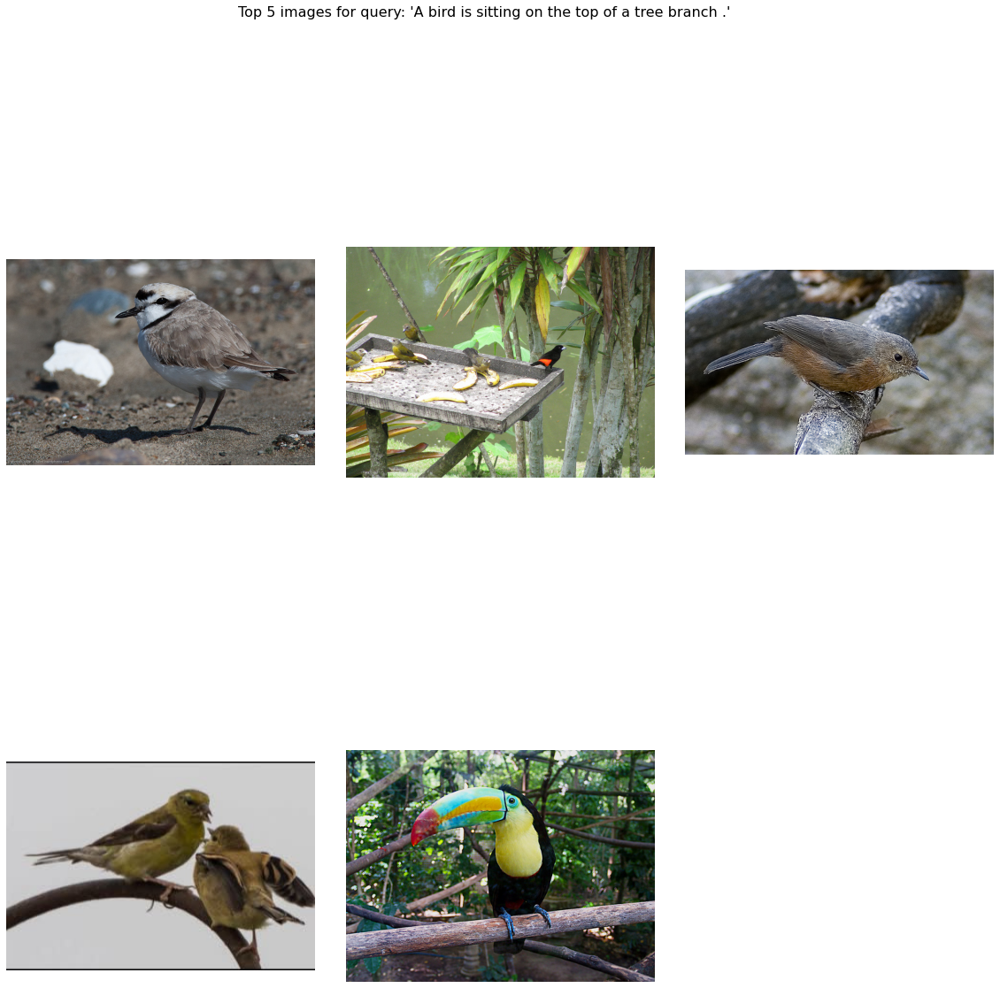

['000000256518.jpg', '000000499109.jpg', '000000527695.jpg', '000000451571.jpg', '000000250766.jpg']


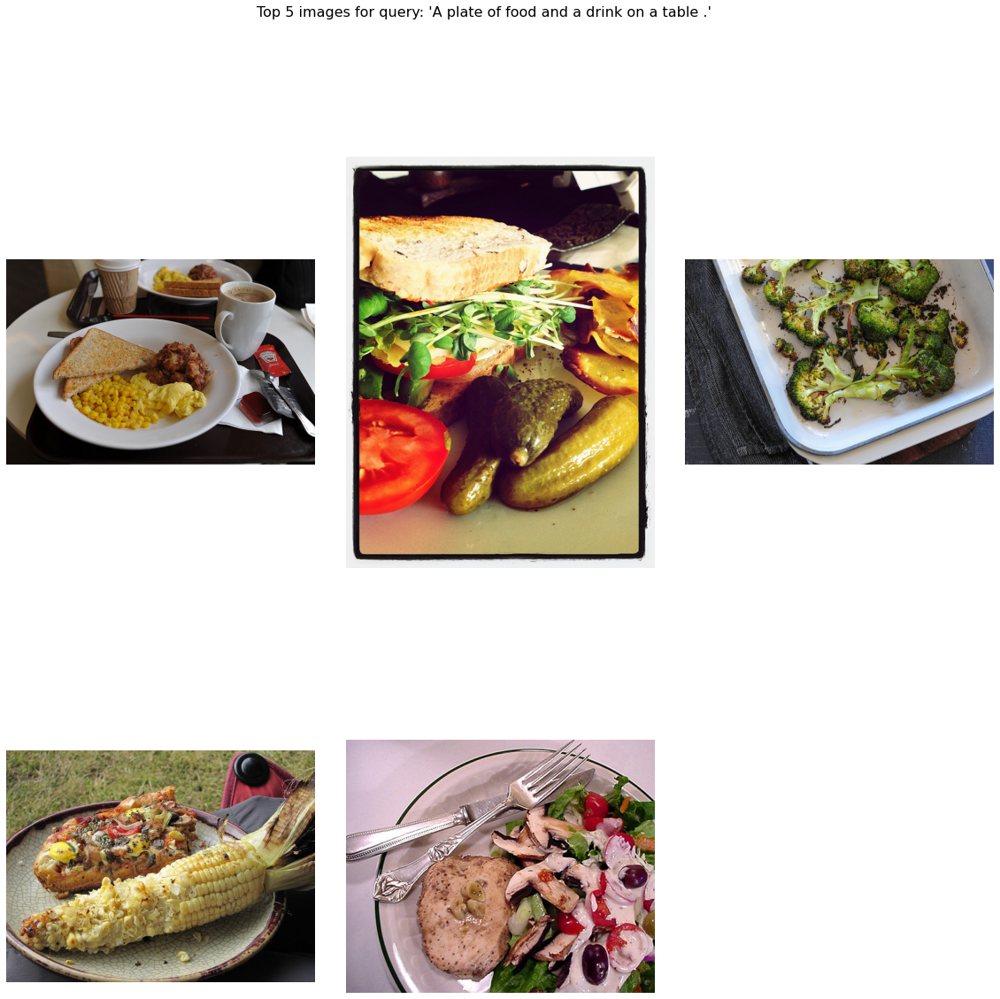

['000000109992.jpg', '000000037689.jpg', '000000003255.jpg', '000000023359.jpg', '000000128112.jpg']


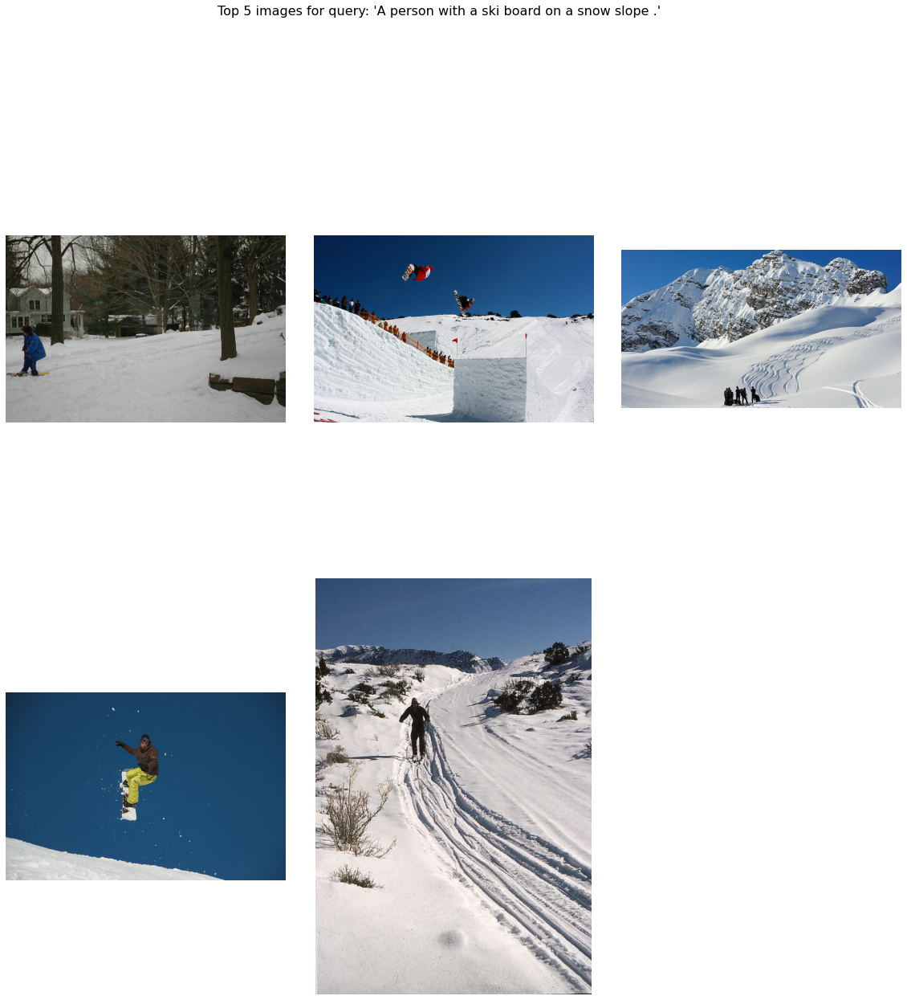

['000000554266.jpg', '000000214869.jpg', '000000086582.jpg', '000000071938.jpg', '000000546626.jpg']


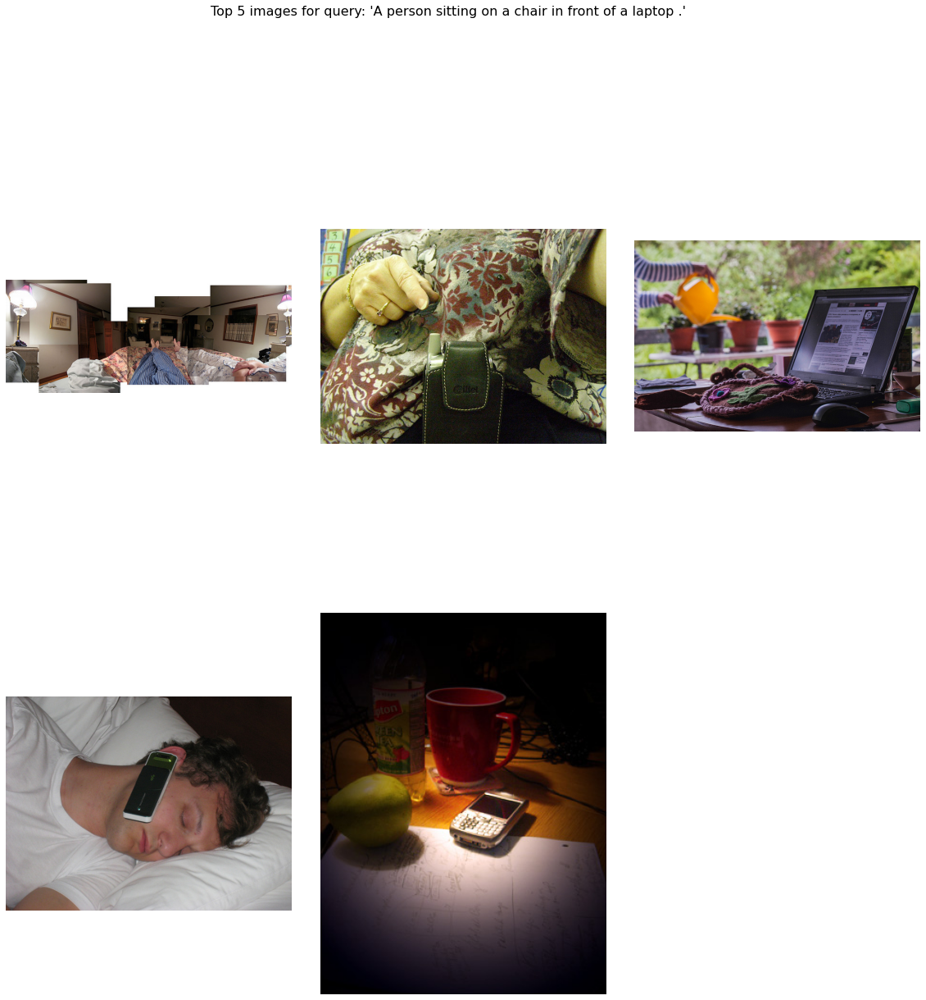

In [37]:
model_name = "coco"
bleu_index = 1
get_images(model_name, bleu_index)

# Query Results for Coco Attention Model

['000000056545.jpg', '000000402519.jpg', '000000106881.jpg', '000000176847.jpg', '000000489046.jpg']


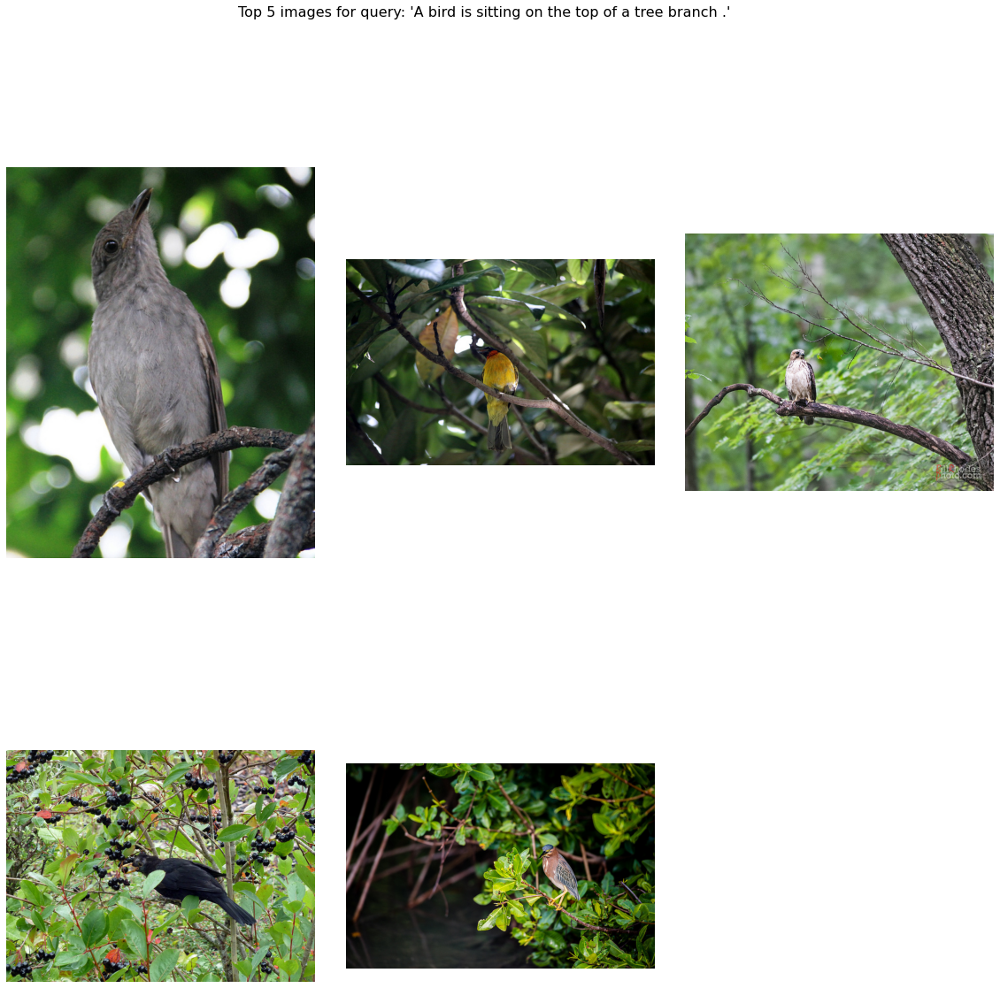

['000000385029.jpg', '000000348708.jpg', '000000173004.jpg', '000000533206.jpg', '000000422998.jpg']


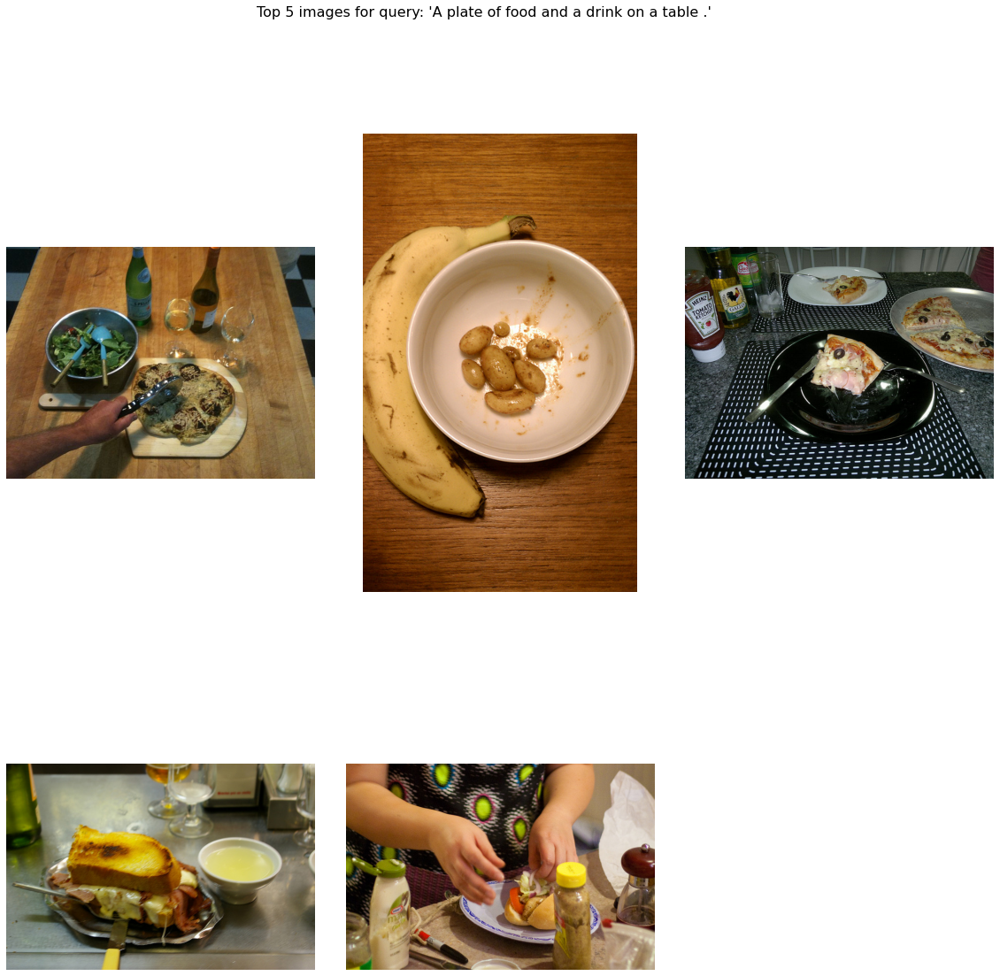

['000000117645.jpg', '000000038118.jpg', '000000426376.jpg', '000000573258.jpg', '000000080671.jpg']


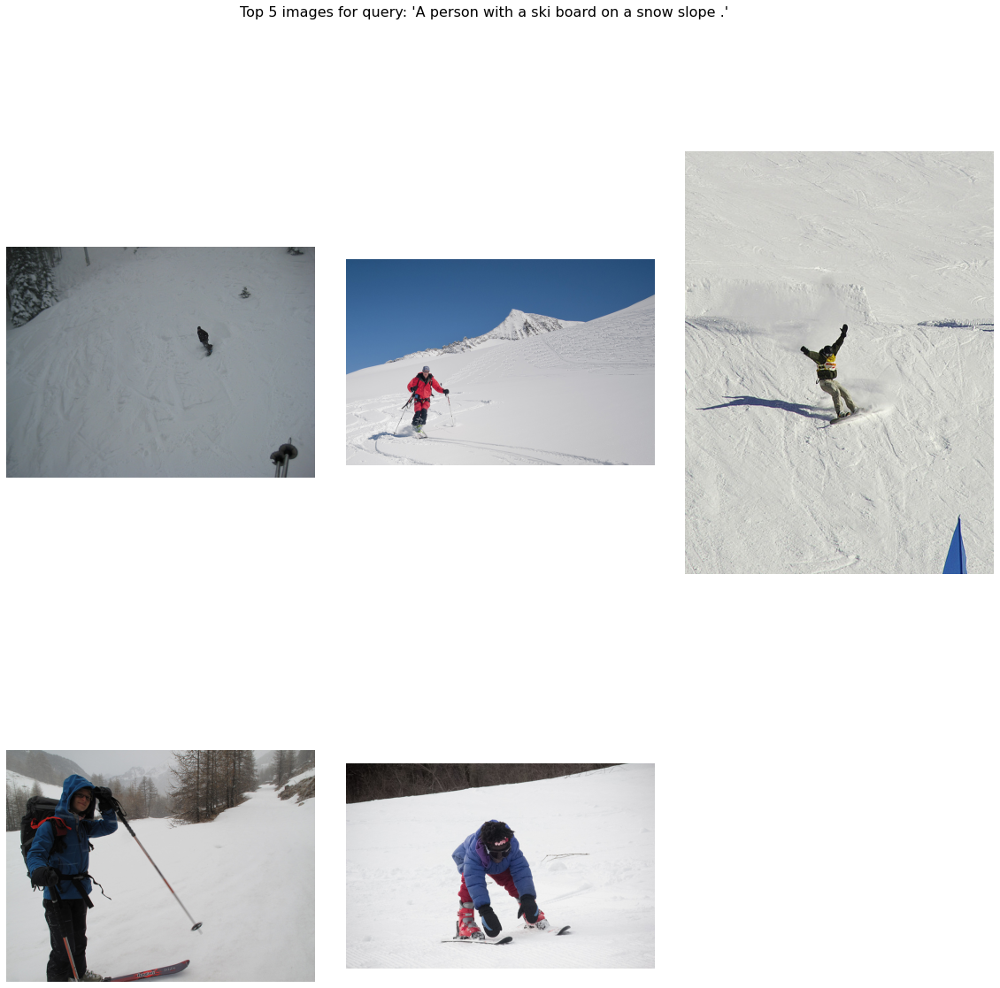

['000000527427.jpg', '000000232684.jpg', '000000310980.jpg', '000000014226.jpg', '000000009483.jpg']


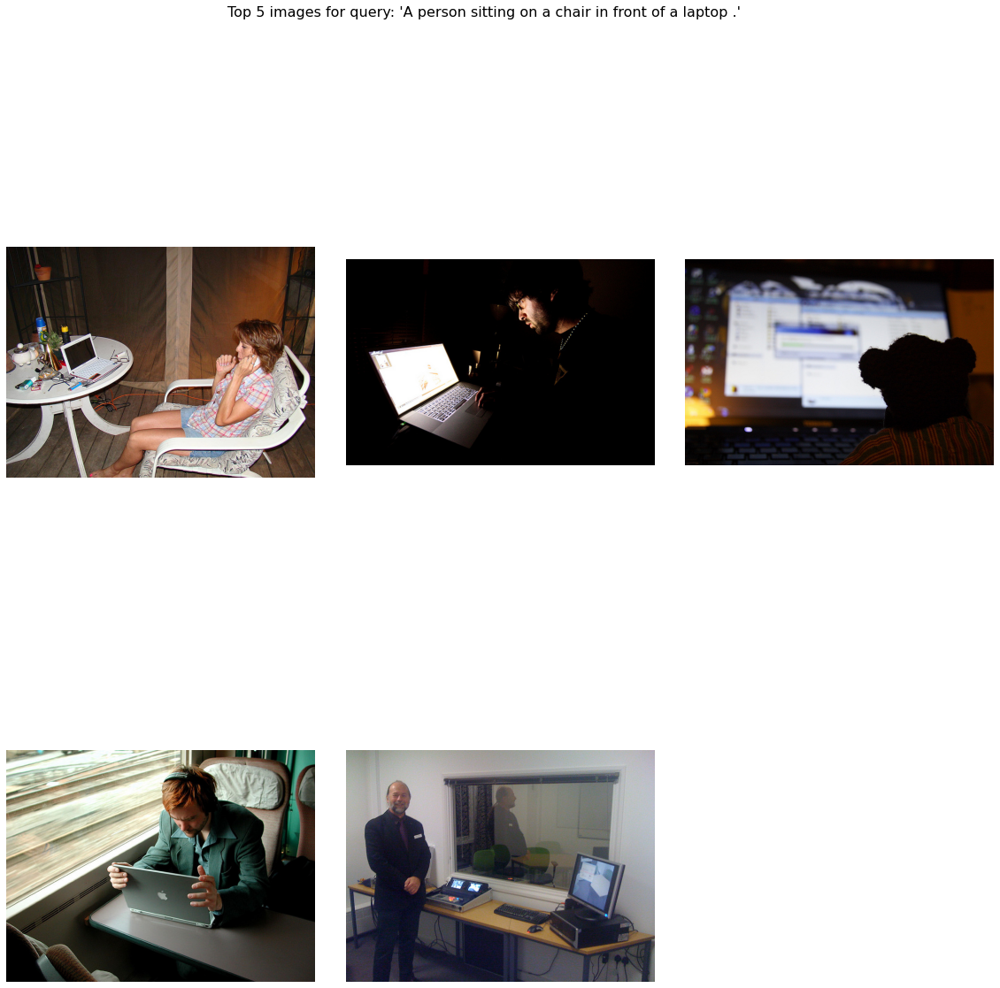

In [47]:
model_name = "coco_attn"
bleu_index = 1
get_images(model_name, bleu_index)

# Query Results for Coco Attention with BERT Model

['000000098261.jpg', '000000402519.jpg', '000000270705.jpg', '000000309452.jpg', '000000337987.jpg']


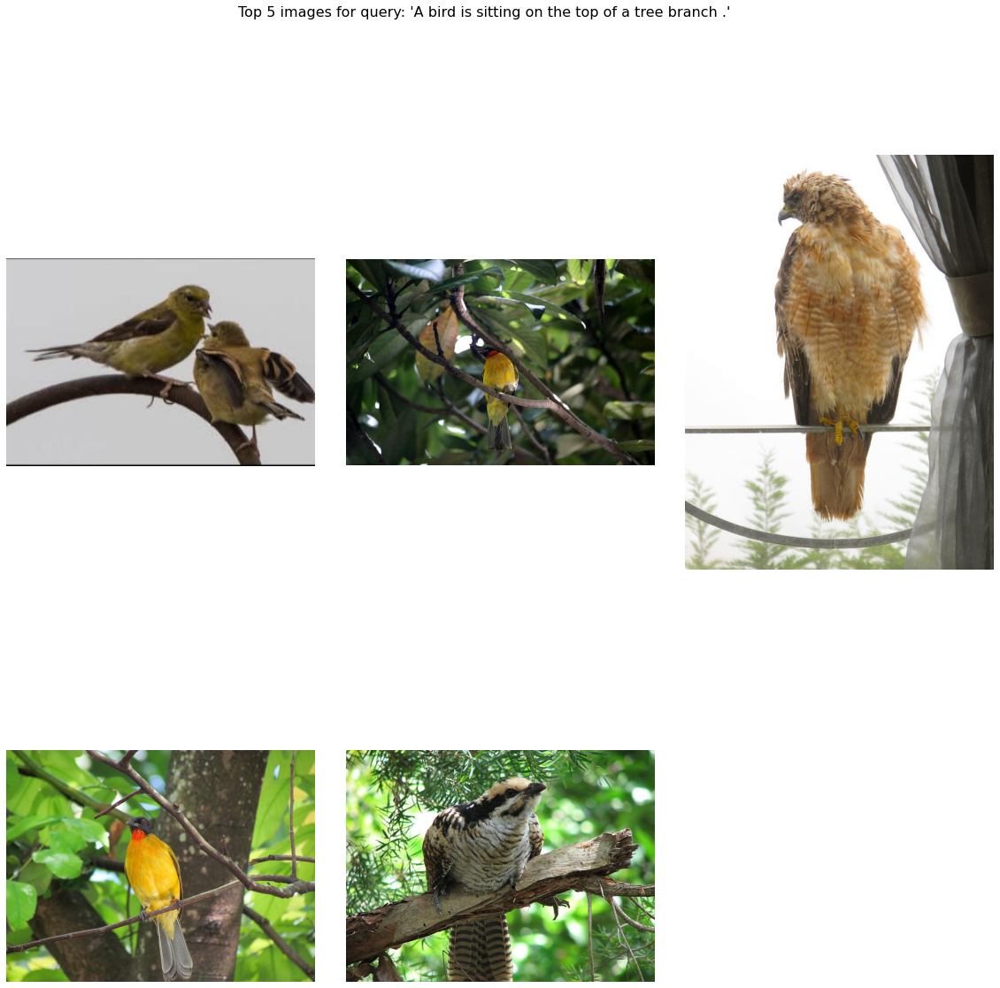

['000000105335.jpg', '000000434479.jpg', '000000079651.jpg', '000000496571.jpg', '000000146489.jpg']


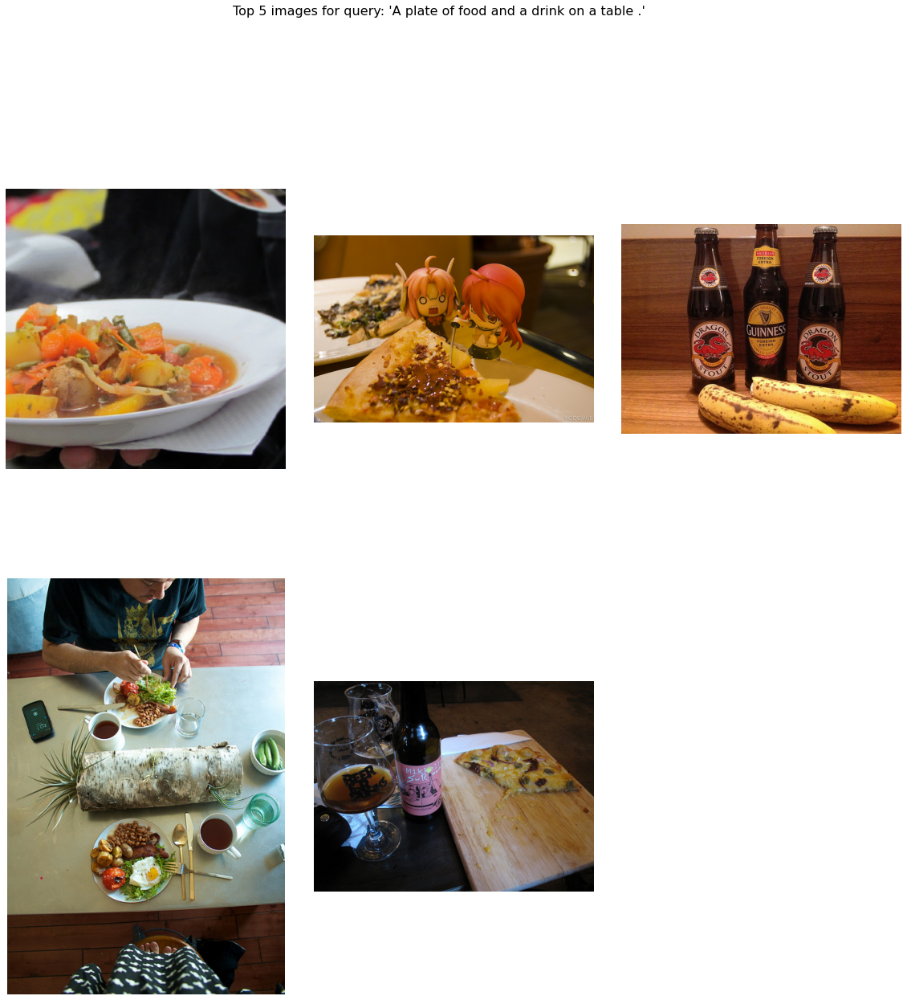

['000000083540.jpg', '000000573258.jpg', '000000173830.jpg', '000000516601.jpg', '000000030504.jpg']


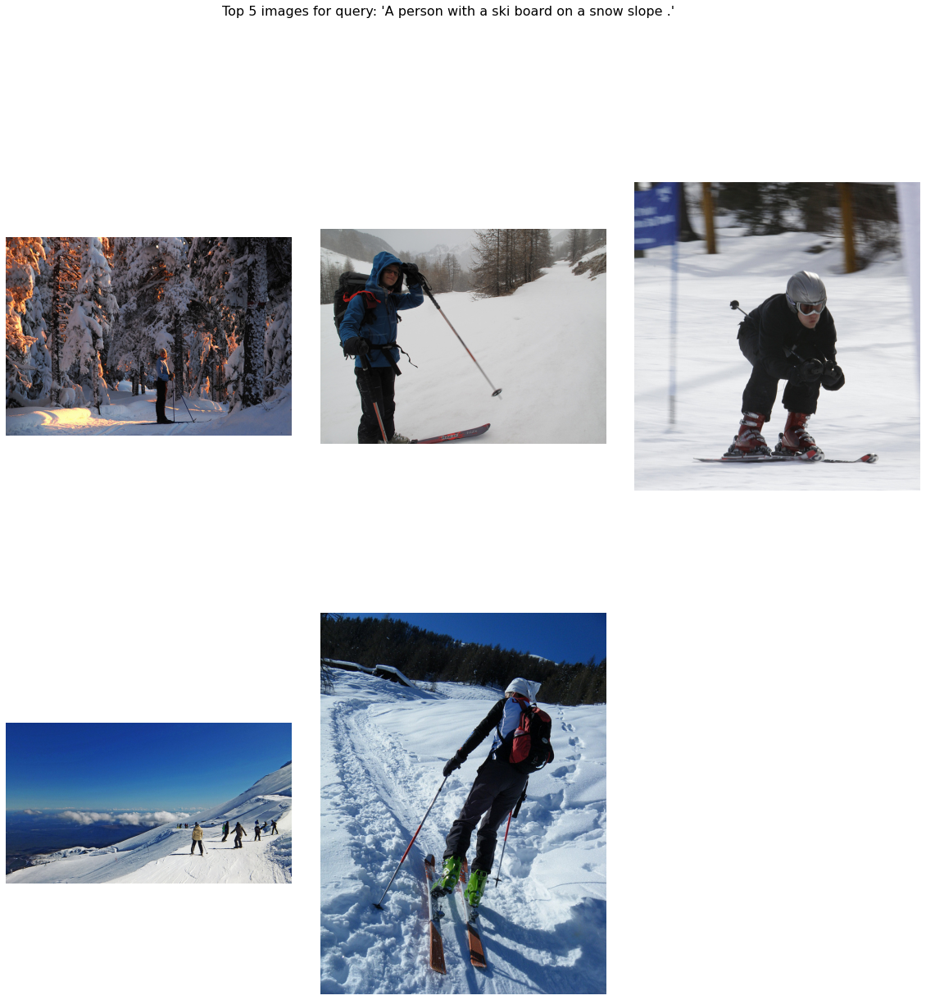

['000000310980.jpg', '000000325838.jpg', '000000232684.jpg', '000000119365.jpg', '000000486040.jpg']


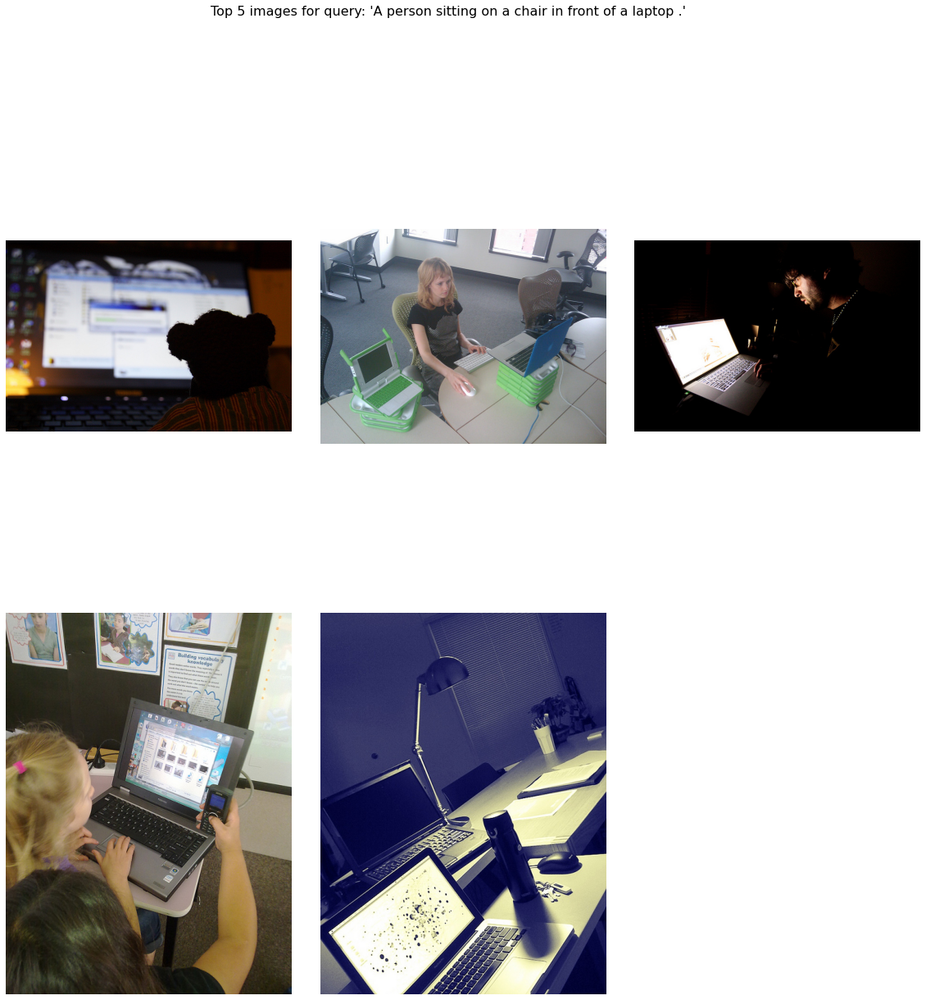

In [23]:
model_name = "coco_attn_bert"
bleu_index = 1
get_images(model_name, bleu_index)

# Related image results for Coco Attention with BERT model

/Users/shubhi/GT_courses/DeepLearning/project/ImageQuery/captioning/data/imagesearch/surfing.jpg
http://0.0.0.0:5000/searchbyimage/coco_attn_bert/val/1/False/surfing.jpg
['000000535858.jpg', '000000381360.jpg', '000000272148.jpg', '000000263403.jpg', '000000199442.jpg']
Input Image


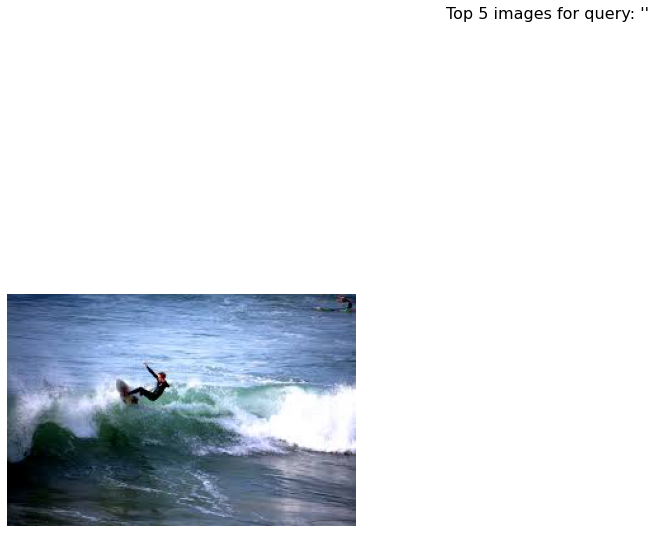

Similar Images


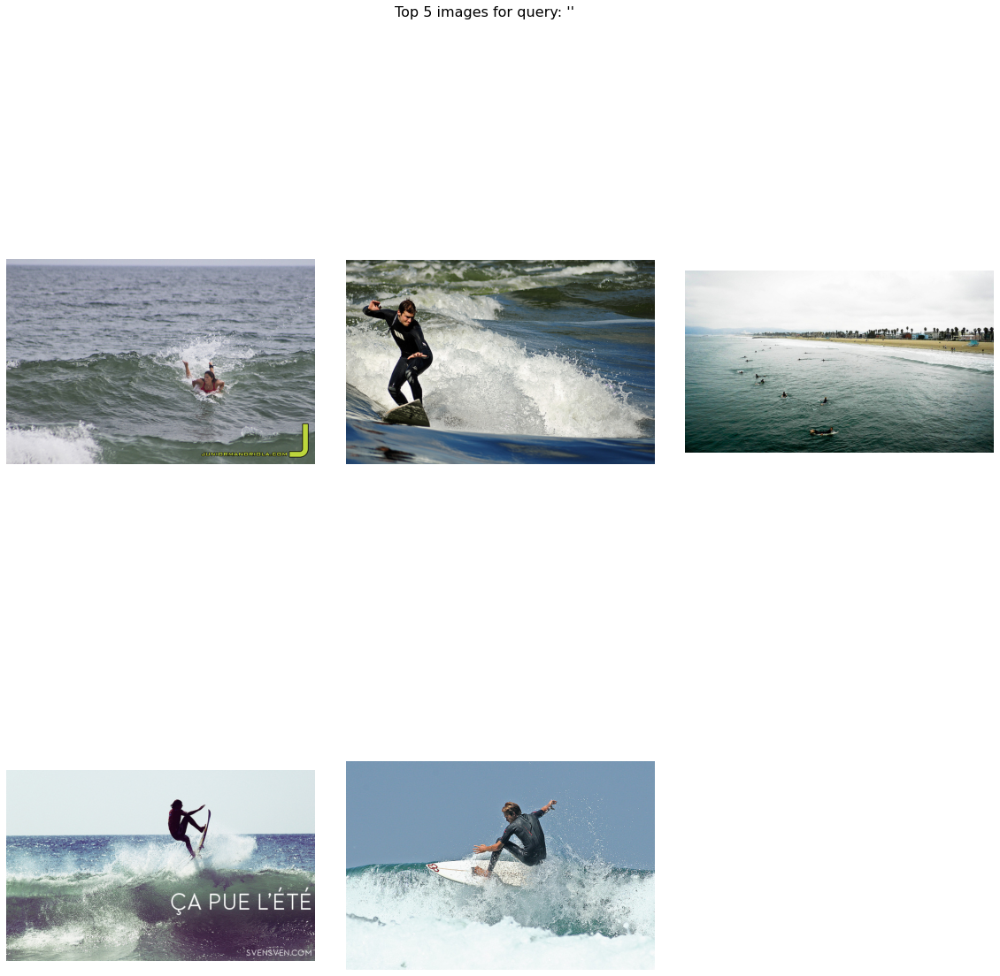

/Users/shubhi/GT_courses/DeepLearning/project/ImageQuery/captioning/data/imagesearch/football.webp
http://0.0.0.0:5000/searchbyimage/coco_attn_bert/val/1/False/football.webp
['000000269316.jpg', '000000127263.jpg', '000000541123.jpg', '000000568213.jpg', '000000142238.jpg']
Input Image


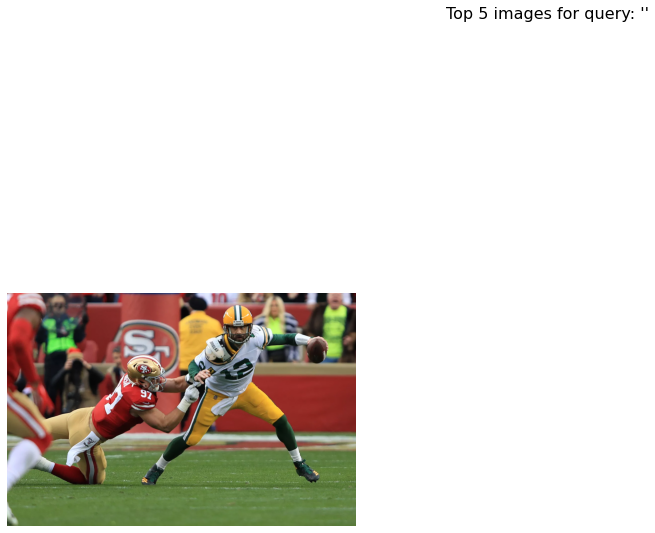

Similar Images


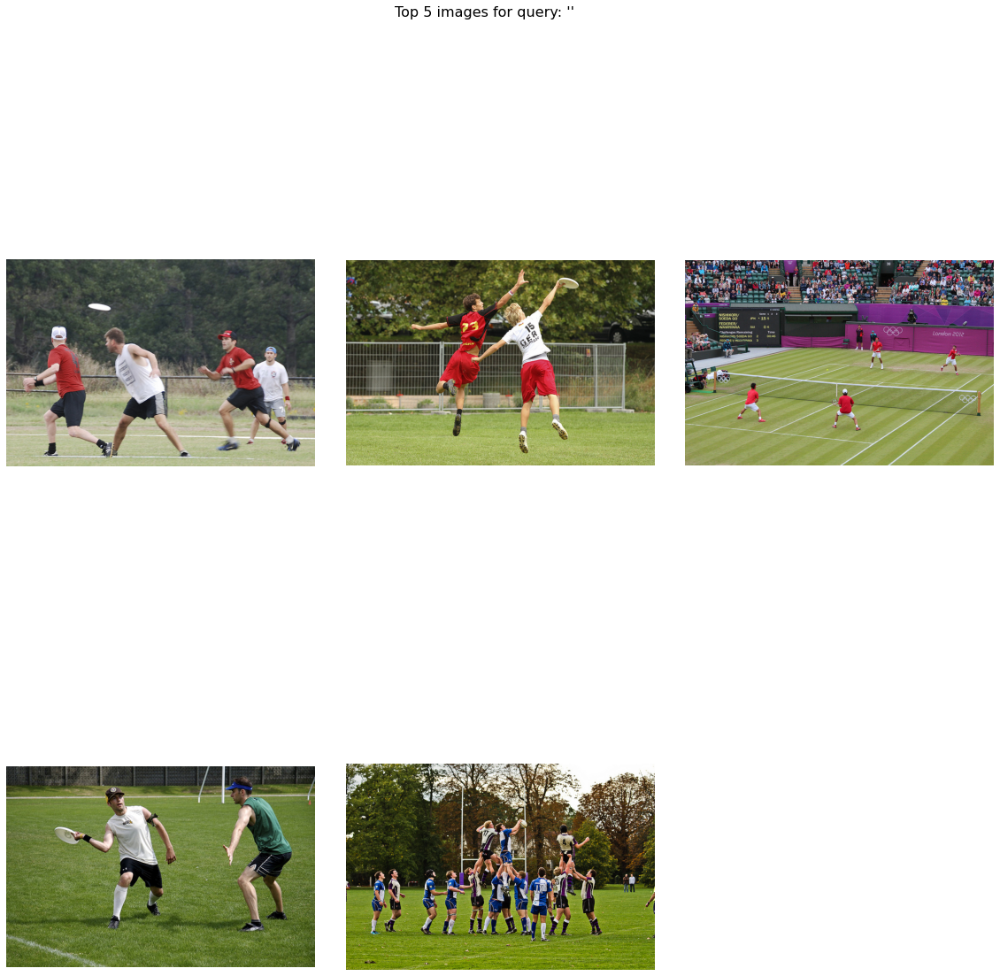

In [26]:
model_name = "coco_attn_bert"
bleu_index = 1
get_images_by_image(model_name, bleu_index)